# Predict Blood Donations ConvNet with Keras including Batchnorm, Dropout and Ensemling

Marek Zielinski, 21/08/2017

In [755]:
version = "001"

### TOC

- [1. Introduction](#introduction)
<br><br>
- [2. Data preparation and EDA](#data-preparation)
    - [2.1 Load data](#load-data)
    - [2.2 Reshape image matrices](#Reshape)
    - [2.3 Visualize data](#visualize-data)
    - [2.4 Data normalization](#data-normalization)
    - [2.5 Label one-hot encoding](#label-one-hot-encoding)
    - [2.6 Split data into training and validation set](#split-train-test)
<br><br>
- [3. Models](#models)
    - [3.1 Baseline model (Linear Regression)](#baseline-model)
    - [3.2 Feature engineering](#feature-engineering)
    - [3.3 Random Forest](#random-forest)
    - [3.4 Model architecture](#model-architecture)
<br><br>
- [4. Prediction and evaluation](#evaluation)
    - [4.1 Data augmentation](#data-augmentation)
    - [4.2 Training and validation of a single model](#training-and-validation)
    - [4.3 Ensembling](#ensembling)
    - [4.4 Confusion matrix and classification report](#confusion-matrix)
    

## <a name="introduction"></a>1. Introduction

We want to predict Blood Donations for a given individual next time the vehicle comes to campus. Data was provided by DrivenData as a part of the Predict Blood Donations competition. We will build a simple Convolutional Neural Network and train it to do feature selection based on kernels.

First we load all necessary libraries

In [936]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
plt.rcParams["figure.figsize"] = (10,6)

np.random.seed(4321)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, log_loss
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from keras import backend as K
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Lambda
from keras.layers.convolutional import Conv1D, ZeroPadding1D
from keras.layers.local import LocallyConnected1D
from keras.layers.pooling import MaxPooling1D
from keras.layers.normalization import BatchNormalization
from keras.layers.noise import GaussianNoise
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import Callback, ReduceLROnPlateau
from keras.metrics import categorical_accuracy, categorical_crossentropy

import itertools
import time

import tensorflow as tf

In [3]:
import dill as pickle

objects_path = "objects/"

def pickle_dump(obj, filename):
    with open(objects_path + filename + '-v-' + version + '.pkl', 'wb') as output:
        pickle.dump(obj, output, pickle.HIGHEST_PROTOCOL)

Manually create tensorflow session to avoid potential OEM errors on laptop's GPU.

In [4]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)
K.set_session(session)
K.set_image_dim_ordering('tf')

In [5]:
sns.set(style='dark', context='notebook', palette='GnBu_d')
sns_palette = sns.color_palette("GnBu_d",10)

## <a name="data-preparation"></a>2. Data preparation and EDA

### <a name="load-data"></a>2.1 Load data

We now load training and test data to perform exporatory analysis.

We have 4 numeric columns that can act as predictors and the last is our class column with values 0 and 1. This is a binary classification task.

In [42]:
#Load training and test data
train = pd.read_csv("data/train.csv", index_col=0)
test = pd.read_csv("data/test.csv",index_col=0)
print(train.shape)
train.head(5)

(576, 5)


,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
619,2,50,12500,98,1
664,0,13,3250,28,1
441,1,16,4000,35,1
160,2,20,5000,45,1
358,1,24,6000,77,0


In [43]:
train.describe()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation,Made Donation in March 2007
count,576.000000,576.000000,576.000000,576.000000,576.000000
mean,9.439236,5.427083,1356.770833,34.050347,0.239583
std,8.175454,5.740010,1435.002556,24.227672,0.427200
min,0.000000,1.000000,250.000000,2.000000,0.000000
25%,2.000000,2.000000,500.000000,16.000000,0.000000
50%,7.000000,4.000000,1000.000000,28.000000,0.000000
75%,14.000000,7.000000,1750.000000,49.250000,0.000000
max,74.000000,50.000000,12500.000000,98.000000,1.000000


In [44]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 576 entries, 619 to 74
Data columns (total 5 columns):
Months since Last Donation     576 non-null int64
Number of Donations            576 non-null int64
Total Volume Donated (c.c.)    576 non-null int64
Months since First Donation    576 non-null int64
Made Donation in March 2007    576 non-null int64
dtypes: int64(5)
memory usage: 27.0 KB


We have 576 rows of observations and no missing values

Now we look at count for each class.

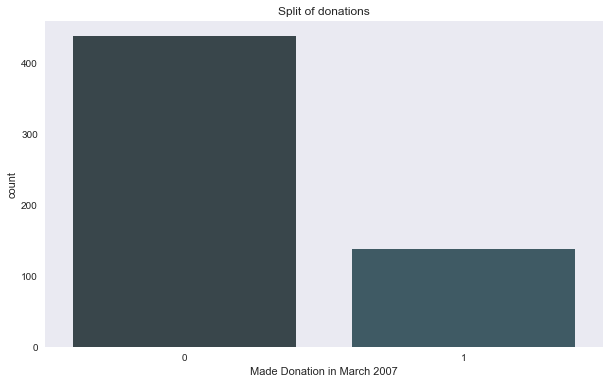

In [395]:
p = sns.countplot(train['Made Donation in March 2007'],palette=sns_palette)
sns.plt.title("Split of donations")
plt.show()

In [623]:
Y_data = train['Made Donation in March 2007']
X_data = train.drop('Made Donation in March 2007',axis=1)

As we can see have very different ranges on our predictor variables. We will use StandardScaler to normalize the data. Default settings are mean=0 and standard deviation of 1.

### <a name="visualize-data"></a>2.3 Visualize data

We now plot pairwise realtions of our data. It looks like `"Number of donation"` is almost perfectly correlated with `"Total Volume Donated"`. Since we want to avoid providing redundant information to our models we will pick `"Number of donations"` and discard `"Total Volume Donated"`. This leaves us with only 3 features.

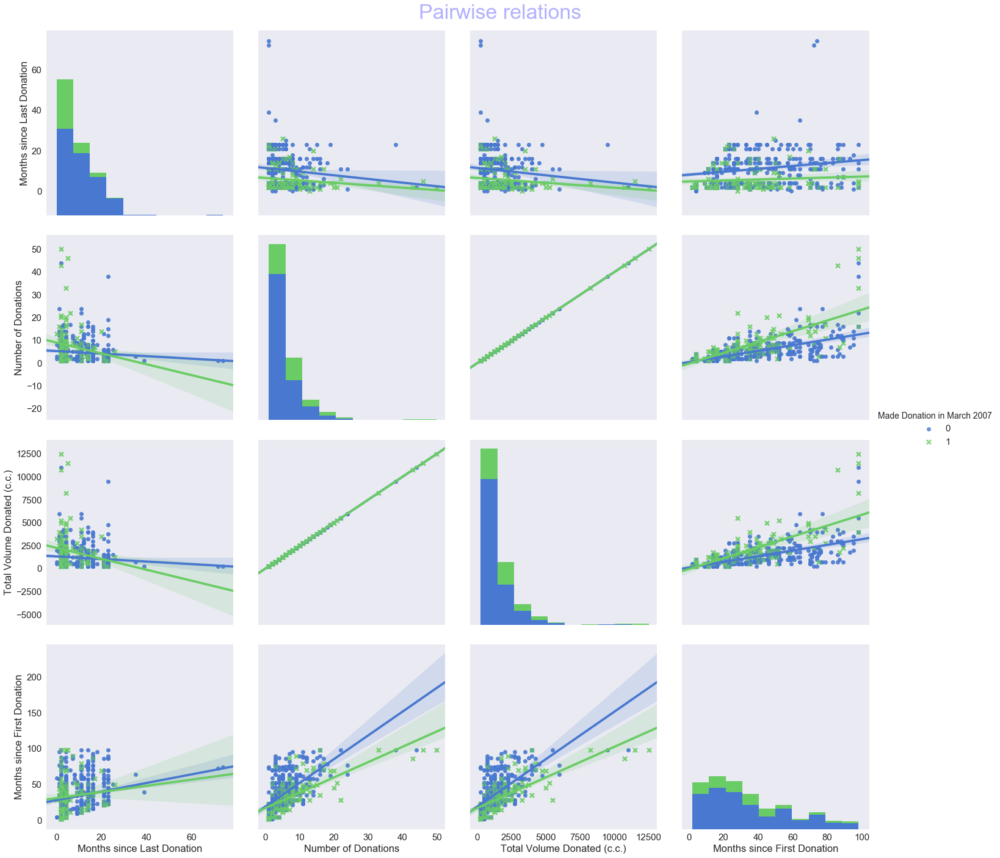

In [820]:
g = sns.pairplot(vars=["Months since Last Donation",
                         "Number of Donations",
                         "Total Volume Donated (c.c.)",
                         "Months since First Donation"
                     ],
                     data=train, hue="Made Donation in March 2007",
                     palette="muted",size=5,
                     kind='reg',markers=['o','x'])

# Change the size of the scatterpoints in graph
g = g.map_offdiag(plt.scatter,  s=35,alpha=0.5)
# Additional line to adjust some title spacing
plt.subplots_adjust(top=0.95)
# Set the Title of the graph
g.fig.suptitle('Pairwise relations',
                fontsize=34,color="b",alpha=0.3)
plt.show()

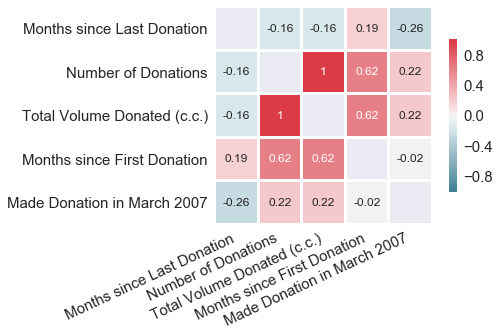

In [879]:
corr = train.corr()
# Generate a mask for the diagonal
mask = np.zeros_like(corr, dtype=np.bool)
np.fill_diagonal(mask,True)
plt.figure(figsize=(6,4))
p = sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, mask=mask, 
                cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, annot=True, linewidths=2,
                cbar_kws={"shrink": .7}, annot_kws={"size": 12})
for tick in p.get_xticklabels():
    tick.set_rotation(25)
    tick.set_horizontalalignment('right')
plt.show()

In [869]:
np.zeros_like(corr, dtype=np.bool)

array([[False, False, False, False, False],
       [False, False, False, False, False],
       [False, False, False, False, False],
       [False, False, False, False, False],
       [False, False, False, False, False]], dtype=bool)

The correlation heatmap confirms that variables ```"Number of Donations"```  and ```"Total Volume Donated"``` are perfectly correlated having correlation coefficient of 1.

In [823]:
X_data.drop("Total Volume Donated (c.c.)", inplace = True, axis=1)

### <a name="data-normalization"></a>2.4 Data normalization

As we saw we have very different ranges on our predictor variables. We will use StandardScaler to normalize the data. Default settings are mean=0 and standard deviation of 1.

In [825]:
scaler = StandardScaler()
X_data = scaler.fit_transform(X_data)
test = scaler.fit_transform(test)

### <a name="label-one-hot-encoding"></a>2.5 Label one-hot encoding

We have 2 classes that we need to one hot encode for the classifiers.

In [626]:
Y_data_cat = to_categorical(Y_data, num_classes = 2)
Y_data_cat[:2]

array([[ 0.,  1.],
       [ 0.,  1.]])

### <a name="split-train-test"></a>2.5 Split data into training and validation set

We will now split our data into training and test sets leaving 70% in the training set and 30% as for validation. We only have 576 observations so we really cannot afford to split it additionaly and have another hold out data.

We will also check the distribution of the classes in the split data. The ```stratify=Y_data``` argument should provide us with similar distribution in both sets. This way we won't have a problem with overrepresentation of some labels.

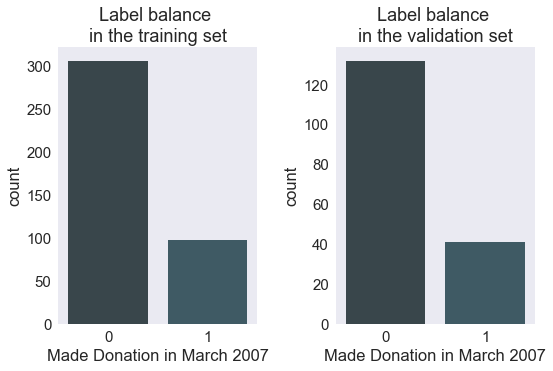

In [833]:
X_train, X_val, Y_train, Y_val = train_test_split(X_data_n, Y_data, train_size=0.7, stratify=Y_data)

plt.subplot(1,2,1)
sns.countplot(Y_train,palette=sns_palette)
sns.plt.title("Label balance \nin the training set")
plt.subplot(1,2,2)
sns.countplot(Y_val,palette=sns_palette)
sns.plt.title("Label balance \nin the validation set")
plt.tight_layout(w_pad=1)
plt.show()

We now do one hot encoding on the training and validation labels.

In [628]:
Y_train_cat = to_categorical(Y_train, num_classes = 2)
Y_val_cat = to_categorical(Y_val, num_classes = 2)

## <a name="models"></a>3. Models

#### helper function: print_metrics(model, X, Y, X_val, Y_val)

We will define a short helper function to display training and validation metrics

In [1012]:
def print_metrics(model, X, Y, X_val, Y_val):
    training_loss = log_loss(Y, model.predict_proba(X))
    training_accuracy = model.score(X, Y)
    validation_loss = log_loss(Y_val, model.predict_proba(X_val))
    validation_accuracy = model.score(X_val,Y_val)
    print("Training loss: " + '{:.4f}'.format(training_loss) 
          + "\t\t Validation Loss: " + '{:.4f}'.format(validation_loss))
    print("Training accuracy: " + '{:.4f}'.format(training_accuracy)
          + "\t Validation accuracy:" + '{:.4f}'.format(validation_accuracy))

### <a name="baseline-model"></a>3.1 Baseline model (Linear Regression)

First we will create a simple linear regression model to serve as our baseline for future improvements and validation of more complex model architectures. We use sklearn ```LogisticRegression()``` that yields Logloss score of 0.5095 

In [1015]:
baseline_clf = LogisticRegression()
baseline_clf.fit(X_train,Y_train)
print_metrics(baseline_clf, X_train, Y_train, X_val, Y_val)

Training loss: 0.4731		 Validation Loss: 0.5095
Training accuracy: 0.7618	 Validation accuracy:0.7746


### <a name="feature-engineering"></a>3.2 Feature engineering

We will now add polynomial features like ```a*b``` or ```a^2``` to our features. When measuring performance below we can see that we get aroun 0.01 improvement on the training log loss and around 0.02 improvement on validation log loss. Not much but it's still usable. It also looks like we are not yet overfitting.

In [1013]:
feature_engineer = PolynomialFeatures(degree=2)
X_train_f = feature_engineer.fit_transform(X_train)
X_val_f = feature_engineer.transform(X_val)

clf = LogisticRegression()
clf.fit(X_train_f,Y_train)
print_metrics(clf, X_train_f, Y_train, X_val_f, Y_val)

Training loss: 0.4651		 Validation Loss: 0.4898
Training accuracy: 0.7792	 Validation accuracy:0.7803


We can try to add a higher degree features, however when we measure log loss we see that while we improved training log loss by around 0.01 our validation log loss rose by 0.1. We are heavily overfitting using this model. We will stick to the 0.4898 benchmark for future improvements. We can try to use higher degree features with better regularized models or with models that have built in feature selection, like Random Forest.

In [1014]:
feature_engineer3 = PolynomialFeatures(degree=3)
X_train_f3 = feature_engineer3.fit_transform(X_train)
X_val_f3 = feature_engineer3.transform(X_val)

clf3 = LogisticRegression()
clf3.fit(X_train_f3,Y_train)
print_metrics(clf3, X_train_f3, Y_train, X_val_f3, Y_val)

Training loss: 0.4530		 Validation Loss: 0.5911
Training accuracy: 0.7965	 Validation accuracy:0.7977


### <a name="random-forest"></a>3.3 Random Forest

Now let's try to use Random Forest Classifier. Our training log loss fell by around 0.07 but our validation log loss rose. It might indicate that we are overfitting. However our validation accuracy score actually gone up. This might indicate that our model is too confident and log loss score penalizes wrong and confident predictions. We can try to clip the probabilities to around 0.14 and 0.86 roughly based on our training accuracy, which gets us a slightly better validation log loss score.

In [1053]:
rf_clf = RandomForestClassifier(n_estimators=100, max_depth=4, max_features='auto', random_state=344)
rf_clf.fit(X_train_f3, Y_train)
print_metrics(rf_clf, X_train_f3, Y_train, X_val_f3, Y_val)
print("Validation log loss score after clipping " 
      + '{:.4f}'.format(log_loss(Y_val, np.clip(rf_clf.predict_proba(X_val_f3),0.14,0.86))))

Training loss: 0.3825		 Validation Loss: 0.5023
Training accuracy: 0.8387	 Validation accuracy:0.7919
Validation log loss score after clipping 0.4919


### <a name="model-architecture"></a>3.3 Model architecture

In [543]:
def lm():
    model = Sequential([
        Dense(4, activation = 'relu', input_shape=(4,)),
        Dense(2, activation = 'softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model    

In [544]:
model_lm = lm()

In [593]:
def nn_model(dropouts = [0.1,0.1,0.25]):
    model = Sequential([
        GaussianNoise(0.1, input_shape=(4,)),
        Dense(16, activation = 'relu', input_shape=(4,)),
        BatchNormalization(),
        Dropout(dropouts[0]),
        GaussianNoise(0.1),
        Dense(32, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(64, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(2, activation = 'softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [742]:
model_nn = nn_model()

In [743]:
model_nn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gaussian_noise_12 (GaussianN (None, 4)                 0         
_________________________________________________________________
dense_329 (Dense)            (None, 16)                80        
_________________________________________________________________
batch_normalization_440 (Bat (None, 16)                64        
_________________________________________________________________
dropout_473 (Dropout)        (None, 16)                0         
_________________________________________________________________
gaussian_noise_13 (GaussianN (None, 16)                0         
_________________________________________________________________
dense_330 (Dense)            (None, 32)                544       
_________________________________________________________________
batch_normalization_441 (Bat (None, 32)                128       
__________

### ConvNet model

In [634]:
def cnn_model(dropouts = [0, 0.1, 0.1, 0.1, 0.15]):
    """Builds and compiles Keras model for CNN with provided dropouts"""
    model = Sequential([
        ZeroPadding1D(input_shape=(4,1)),
        LocallyConnected1D(12,3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[0]),
        ZeroPadding1D(),
        LocallyConnected1D(24, 3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[1]),
        ZeroPadding1D(),
        LocallyConnected1D(24, 3, activation='relu'),
        BatchNormalization(axis=1),
        Dropout(dropouts[1]),
        Flatten(),
        Dropout(dropouts[2]),
        Dense(96, activation='relu'),
        BatchNormalization(),
        Dropout(dropouts[3]),
        Dense(96, activation='relu'),
        BatchNormalization(),
        Dropout(dropouts[4]),
        Dense(2,activation='softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [635]:
model = cnn_model()

In [119]:
pickle_dump(model.get_config(),'cnn-model-get_config-dump')

In [636]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding1d_190 (ZeroPadd (None, 6, 1)              0         
_________________________________________________________________
locally_connected1d_113 (Loc (None, 4, 12)             192       
_________________________________________________________________
batch_normalization_366 (Bat (None, 4, 12)             16        
_________________________________________________________________
dropout_392 (Dropout)        (None, 4, 12)             0         
_________________________________________________________________
zero_padding1d_191 (ZeroPadd (None, 6, 12)             0         
_________________________________________________________________
locally_connected1d_114 (Loc (None, 4, 24)             3552      
_________________________________________________________________
batch_normalization_367 (Bat (None, 4, 24)             16        
__________

Now let's look at our ConvNet model as a graph.

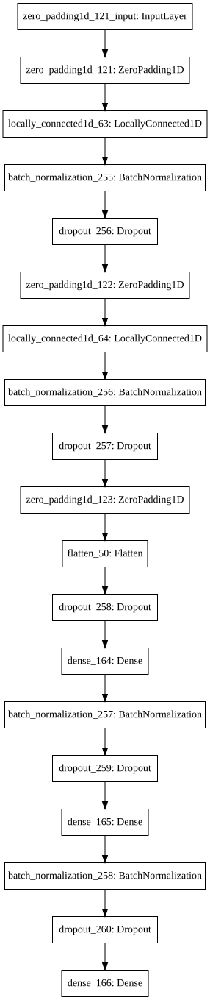

In [424]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
#import os
#os.environ["PATH"] += os.pathsep + 'd:/Anaconda3/Library/bin/graphviz/'
SVG(model_to_dot(model).create(prog='dot', format='svg'))

With Keras 2 it's better to set batch_size so it is a divisor of the number of samples. The new version requires steps per epoch instead of sample number so we either will have aditional repeated samples per epoch or less.

In [425]:
batch_size=50

## <a name="evaluation"></a>4. Prediction and evaluation

In [168]:
batch_size=50

In [127]:
??tf.contrib.keras.preprocessing.image.NumpyArrayIterator

In [128]:
??ImageDataGenerator

In [183]:
??DataGenerator

### <a name="data-augmentation"></a>4.1 Data augmentation

In [580]:
class DataGenerator():
    def __init__(self, ranges=[0]):
        self.ranges = ranges
        self.batch_size = 1
        self.n = None
        
    def flow(self, X,Y, b_size, reshape_x = True):
        self.batch_size = b_size
        self.n = len(X)
        while 1:
          # Generate batches
          ids = np.random.choice(range(len(X)),batch_size)
          X_n = X[ids]
          Y_n = Y[ids]
          X_n = self.modify(X_n)
          if (reshape_x):
              X_n = X_n.reshape(-1,X_n.shape[1],1)
          yield X_n, Y_n
        
    def modify(self, X):
        dx = np.array([np.random.normal(scale=x,size=len(X)) for x in self.ranges])
        return X + dx.swapaxes(1,0)

In [614]:
np.random.normal(scale=0.05,size=5)

array([-0.01545578,  0.0065404 , -0.06590518, -0.08022417, -0.06077465])

In [637]:
def get_batches(pct_of_train_batches = 0.3, reshape_x = True):
    #genAug = ImageDataGenerator(rotation_range=5, width_shift_range=0.05, shear_range=0.05,
    #                         height_shift_range=0.05, zoom_range=0.05)
    gen = DataGenerator(ranges=[0,0,0,0])
    genAug = DataGenerator(ranges=[0.05,0.05,0.05,0.05])
    
    batches = gen.flow(X_train, Y_train_cat, b_size = batch_size, reshape_x = reshape_x)
    val_batches = gen.flow(X_val, Y_val_cat, b_size = batch_size, reshape_x = reshape_x)
    batches_aug = genAug.flow(X_train, Y_train_cat, b_size = batch_size, reshape_x = reshape_x)

    train_batches = int((len(X_train) // batch_size) * pct_of_train_batches)
    print("Number of training batches per epoch: " + str(train_batches))
    return batches, batches_aug, val_batches, train_batches
    
batches, batches_aug, val_batches, train_batches = get_batches(pct_of_train_batches = 1)
batches_nn, batches_aug_nn, val_batches_nn, train_batches_nn = get_batches(pct_of_train_batches = 1, reshape_x = False)

Number of training batches per epoch: 8
Number of training batches per epoch: 8


In [588]:
print(next(batches)[:2])
print(next(batches_aug)[:2])

(array([[[ 1.02275679],
        [ 0.58802818],
        [ 0.58802818],
        [ 1.18068373]],

       [[-0.81478546],
        [ 0.89407583],
        [ 0.89407583],
        [ 0.55325065]],

       [[ 0.3664917 ],
        [-0.48313861],
        [-0.48313861],
        [ 1.76628793]],

       [[-0.55227942],
        [ 0.28198052],
        [ 0.28198052],
        [ 0.26044855]],

       [[ 0.3664917 ],
        [-0.63616243],
        [-0.63616243],
        [-0.95258873]],

       [[-0.81478546],
        [-0.78918626],
        [-0.78918626],
        [-1.32904857]],

       [[-0.81478546],
        [-0.17709095],
        [-0.17709095],
        [-0.74344437]],

       [[ 1.67902188],
        [-0.63616243],
        [-0.63616243],
        [ 0.76239501]],

       [[-0.81478546],
        [ 0.43500435],
        [ 0.43500435],
        [ 1.72445906]],

       [[ 0.76025076],
        [ 0.28198052],
        [ 0.28198052],
        [ 0.67873727]],

       [[-0.81478546],
        [-0.48313861],
        [-0.4

### <a name="training-and-validation"></a>4.2 Training and validation of a single model

The approach that we have chosen 
First we try a few epochs with default learning rate and no data augmentation. Most of the time it's the best approach. We try to do it without Augmentation first to make sure that the model does not get stuck on predicting the same class for every input.
After a few tries the most promising approach was to start training the model without data augmentation for a few epochs. Then we try to confuse the model with data augmentation and then again we train the model using the original training data.

### fit_model function

In [618]:
def fit_model(model, epochs_per_each_step=4, epochs_last_step=2,
              steps=[4,4],
              use_train_batches = None,
              history_callback=None,
              model_save_callback=None,
              history=[], 
              callbacks=[],
              start_lr=None, lr_decrease_after_steps=1, min_lr=0.000000001):
    """Runs model.fit_generator alternating non augemented and augmented data"""
    lr_changed = False
    model_save_callback.Reset()
    callbacks.append(model_save_callback)
    callbacks.append(history_callback)
    
    if (use_train_batches == None):
        use_train_batches = batches.n // batches.batch_size
    if (start_lr == None):
        print("Starting with default learning rate.")
    else:
        model.optimizer.lr = start_lr
        last_lr = start_lr
        print("Setting learning rate to: " + str(model.optimizer.lr))
        
    for i in range(steps[0]):
        print("Fitting step: " + str(i+1))
        if ((i > 0) and (lr_changed)):
            print("Setting learning rate to: " + str(last_lr))
            lr_changed = False
            
        print("No data augmentation")
        model.fit_generator(batches, epochs=epochs_per_each_step, 
                            steps_per_epoch = use_train_batches,
                            validation_data=val_batches, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=1,
                            callbacks=callbacks
                           )
        history.extend(history_callback)
        
        #First set the learning rate as high as possible
        if (i==0 and (start_lr == None)):
            model.optimizer.lr = 0.1
            last_lr = 0.1
            lr_changed = True
        elif ((i % lr_decrease_after_steps) == 0):
            #Then decrease the learning rate sysytematically
            last_lr = last_lr/10
            model.optimizer.lr = last_lr
            lr_changed = True
            if (last_lr < min_lr):
                model.optimizer.lr = min_lr 
                last_lr = min_lr
                print('Minimum learning rate limit reached.')
                lr_changed = False

    for i in range(steps[1]):
        print("Fitting step: " + str(steps[0] + i + 1))
        if ((i > 0) and (lr_changed)):
            print("Setting learning rate to: " + str(last_lr))
            lr_changed = False
            
        print("Add data augmentation")
        model.fit_generator(batches_aug, epochs=epochs_per_each_step, 
                            steps_per_epoch = use_train_batches,
                            validation_data=val_batches, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=1,
                            callbacks=callbacks
                           )
        history.extend(history_callback)
        if (i==0 and (start_lr == None)):
            model.optimizer.lr = 0.1
            last_lr = 0.1
            lr_changed = True       
        if ((i % lr_decrease_after_steps) == 0):
            #Then decrease the learning rate sysytematically
            last_lr = last_lr/10
            model.optimizer.lr = last_lr
            lr_changed = True
            if (last_lr < min_lr):
                model.optimizer.lr = min_lr 
                last_lr = min_lr
                print('Minimum learning rate limit reached.')
                lr_changed = False
                
    print("No data augmentation - Last step")
    print("Setting learning rate to: " + str(last_lr))
    model.fit_generator(batches, epochs=epochs_last_step, 
                            steps_per_epoch = use_train_batches,
                            validation_data=val_batches, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=1,
                            callbacks=callbacks
                           )
    history.extend(history_callback)
    return model

### Callbacks

Let's define a callback that will save the log after every batch. As seen in Keras documentation.

In [430]:
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.loss = []
        self.accuracy = []
        self.epoch_loss = []
        self.epoch_accuracy = []
        self.val_loss = []
        self.val_accuracy = []
        self.batches_size = []
        self.batches_size_epoch = []
        self.img_shown = []

    def on_batch_end(self, batch, logs={}):
        self.loss.append(logs.get('loss'))
        self.accuracy.append(logs.get('acc'))
        self.batches_size.append(logs.get('size'))
        self.batches_size_epoch.append(logs.get('size'))
        
    def on_epoch_end(self, epoch, logs={}):
        self.epoch_loss.append(logs.get('loss'))
        self.epoch_accuracy.append(logs.get('acc'))
        self.val_loss.append(logs.get('val_loss'))
        self.val_accuracy.append(logs.get('val_acc'))
        self.img_shown.append(np.sum(self.batches_size_epoch))
        self.batches_size_epoch = []
        
history_callback = LossHistory()

And a class that will be accumulating our metrics

In [431]:
class History():
    def __init__(self):
        self.loss = []
        self.accuracy = []
        self.epoch_loss = []
        self.epoch_accuracy = []
        self.val_loss = []
        self.val_accuracy = []
        self.batches_size = []
        self.img_shown = []
        
    def extend(self,history):
        self.loss.extend(history.loss)
        self.accuracy.extend(history.accuracy)
        self.epoch_loss.extend(history.epoch_loss)
        self.epoch_accuracy.extend(history.epoch_accuracy)
        self.val_loss.extend(history.val_loss)
        self.val_accuracy.extend(history.val_accuracy)
        self.batches_size.extend(history.batches_size)
        self.img_shown.extend(history.img_shown)
    
    def append(self,history):
        self.loss.append(history.loss)
        self.accuracy.append(history.accuracy)
        self.epoch_loss.append(history.epoch_loss)
        self.epoch_accuracy.append(history.epoch_accuracy)
        self.val_loss.append(history.val_loss)
        self.val_accuracy.append(history.val_accuracy)
        self.batches_size.append(history.batches_size)
        self.img_shown.append(history.img_shown)

In [432]:
class ModelSave(Callback):
    def __init__(self, max_val_acc=0, treshold=0.8):
        self.max_val_accuracy = 0
        self.min_val_loss = np.inf
        self.treshold = treshold
        self.best_model_weights = None
    
    def Reset(self):
        self.max_val_accuracy = 0
        self.min_val_loss = np.inf
        self.best_model_weights = None
        
    def on_epoch_end(self, epoch, logs={}):
        v_acc = logs.get('val_acc')
        v_loss = logs.get('val_loss')
        if ((v_acc > self.treshold) and ((v_acc > self.max_val_accuracy) or (v_loss < self.min_val_loss))):
            if (v_acc > self.max_val_accuracy):
                self.max_val_accuracy = v_acc
            if (v_loss < self.min_val_loss):
                 self.min_val_loss = v_loss
            self.best_model_weights = self.model.get_weights()
            #self.model.save_weights(model_path + 'temp-max-val-acc-cnn-mnist-v' + version +'.pkl')
        
model_save_callback = ModelSave()

Now we train a single model using 2 epochs per each training steps and a total of 4 steps. This will give us a total of 6 x 5 + 3 = 33 epochs of training.

In [198]:
model_path = 'models/'

### def train_single_model

In [620]:
def train_single_model(model,start_lr=None,history=None, 
                       epochs_per_each_step=5,
                       epochs_last_step=5,
                       steps=[4,4],
                       lr_decrease_after_steps=1
                      ):
    if (history == None):
        history = History()

    start_time = time.time()

    model = fit_model(model,epochs_per_each_step=epochs_per_each_step, epochs_last_step=epochs_last_step,
                  steps=steps,
                  use_train_batches = train_batches,
                  history_callback = history_callback,
                  model_save_callback=model_save_callback,
                  history=history,
                  lr_decrease_after_steps=lr_decrease_after_steps,
                  start_lr = start_lr
                 )

    #load best model weights
    if (model_save_callback.best_model_weights != None and model_save_callback.max_val_accuracy > 0):
        print("\nRetrieving best model weights with validation accuracy: " + str(model_save_callback.max_val_accuracy))
        model.set_weights(model_save_callback.best_model_weights)
        #model.load_weights(model_path + 'temp-max-val-acc-cnn-mnist-v' + version +'.pkl')

    elapsed_time = time.time() - start_time
    print("\nElapsed single model training time: " + str(elapsed_time//60) + " minutes " + str(elapsed_time % 60) + " seconds")

    ver_s = "s-" + version
    print("\nSaving weights for model " + ver_s)
    model.save_weights(model_path + 'cnn-mnist-' + ver_s +'.pkl')
    return model

### Model Training

### Linear model

In [546]:
history_lm = History()
model_lm.fit_generator(batches_nn, epochs=30, 
                            steps_per_epoch = train_batches,
                            validation_data=val_batches_nn, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=1
                           )

Epoch 1/30
11/11 [==============================] - 0s - loss: 0.6359 - acc: 0.6582 - val_loss: 0.6601 - val_acc: 0.6680
Epoch 2/30
11/11 [==============================] - 0s - loss: 0.6516 - acc: 0.6345 - val_loss: 0.6407 - val_acc: 0.6880
Epoch 3/30
11/11 [==============================] - 0s - loss: 0.6606 - acc: 0.6382 - val_loss: 0.6473 - val_acc: 0.6880
Epoch 4/30
11/11 [==============================] - 0s - loss: 0.6549 - acc: 0.6345 - val_loss: 0.6214 - val_acc: 0.7280
Epoch 5/30
11/11 [==============================] - 0s - loss: 0.6392 - acc: 0.6582 - val_loss: 0.6324 - val_acc: 0.7080
Epoch 6/30
11/11 [==============================] - 0s - loss: 0.6438 - acc: 0.6673 - val_loss: 0.6252 - val_acc: 0.7320
Epoch 7/30
11/11 [==============================] - 0s - loss: 0.6419 - acc: 0.6382 - val_loss: 0.6409 - val_acc: 0.6760
Epoch 8/30
11/11 [==============================] - 0s - loss: 0.6433 - acc: 0.6509 - val_loss: 0.6080 - val_acc: 0.7360
Epoch 9/30
11/11 [==============

### Simple NN

In [744]:
model_nn.history

AttributeError: 'Sequential' object has no attribute 'history'

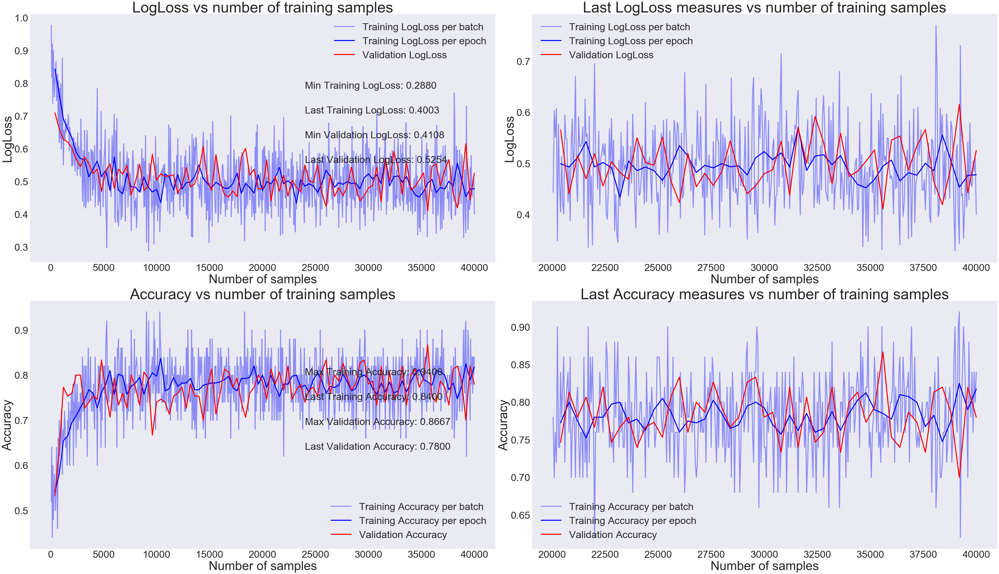

In [751]:
model_nn = nn_model()
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
              patience=5, min_lr=0.00000000001)
model_nn.fit_generator(batches_aug_nn, epochs=100, 
                            steps_per_epoch = train_batches,
                            validation_data=val_batches_nn, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=0,
                       callbacks = [reduce_lr,history_callback]
                           )
plot_metrics(history_callback, last_perc = 0.5, unit='samples')
plt.tight_layout()

### ConvNet training part 1

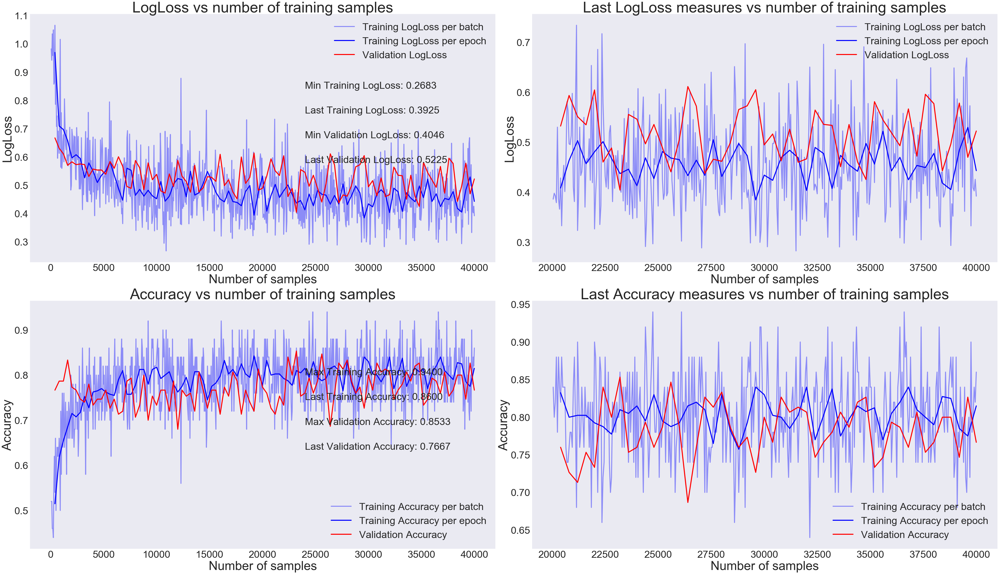

In [754]:
model_cnn = cnn_model()
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
              patience=10, min_lr=0.000000000001)
model_cnn.fit_generator(batches_aug, epochs=100, 
                            steps_per_epoch = train_batches,
                            validation_data=val_batches, 
                            validation_steps = len(X_val) // batch_size, 
                            verbose=0,
                       callbacks = [reduce_lr,history_callback]
                           )
plot_metrics(history_callback, last_perc = 0.5, unit='samples')
plt.tight_layout()

### ConvNet training

In [638]:
history = History()
model = train_single_model(model,history=history, 
                           epochs_per_each_step=12,
                           epochs_last_step=0,
                           steps=[0,10],
                           lr_decrease_after_steps=2
                          )

Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/12
8/8 [==============================] - 6s - loss: 0.9752 - acc: 0.5225 - val_loss: 0.6736 - val_acc: 0.7733
Epoch 2/12
8/8 [==============================] - 0s - loss: 0.8030 - acc: 0.5900 - val_loss: 0.6441 - val_acc: 0.7733
Epoch 3/12
8/8 [==============================] - 0s - loss: 0.7012 - acc: 0.6200 - val_loss: 0.6237 - val_acc: 0.7600
Epoch 4/12
8/8 [==============================] - 1s - loss: 0.6468 - acc: 0.6775 - val_loss: 0.5884 - val_acc: 0.7733
Epoch 5/12
8/8 [==============================] - 0s - loss: 0.6757 - acc: 0.6950 - val_loss: 0.6080 - val_acc: 0.7133
Epoch 6/12
8/8 [==============================] - 1s - loss: 0.6610 - acc: 0.6600 - val_loss: 0.5502 - val_acc: 0.8067
Epoch 7/12
8/8 [==============================] - 0s - loss: 0.5561 - acc: 0.7525 - val_loss: 0.5619 - val_acc: 0.7867
Epoch 8/12
8/8 [==============================] - 0s - loss: 0.5517 - acc: 0.7625 - val_loss

8/8 [==============================] - 0s - loss: 0.4546 - acc: 0.8100 - val_loss: 0.4520 - val_acc: 0.8400
Epoch 7/12
8/8 [==============================] - 0s - loss: 0.4060 - acc: 0.8125 - val_loss: 0.5497 - val_acc: 0.7867
Epoch 8/12
8/8 [==============================] - 0s - loss: 0.4351 - acc: 0.8075 - val_loss: 0.5606 - val_acc: 0.7600
Epoch 9/12
8/8 [==============================] - 0s - loss: 0.4604 - acc: 0.8375 - val_loss: 0.4237 - val_acc: 0.8267
Epoch 10/12
8/8 [==============================] - 0s - loss: 0.4457 - acc: 0.8150 - val_loss: 0.5499 - val_acc: 0.7867
Epoch 11/12
8/8 [==============================] - 0s - loss: 0.4672 - acc: 0.8025 - val_loss: 0.5939 - val_acc: 0.7400
Epoch 12/12
8/8 [==============================] - 0s - loss: 0.4562 - acc: 0.8075 - val_loss: 0.5188 - val_acc: 0.7933
Fitting step: 7
Add data augmentation
Epoch 1/12
8/8 [==============================] - 0s - loss: 0.4221 - acc: 0.8000 - val_loss: 0.5760 - val_acc: 0.7600
Epoch 2/12
8/8 [==

In [483]:
pickle_dump(history,'cnn-train-history-dump')

Now let's look at loss function and accuracy charts during training. Training Loss and accuracy was logged after each batch and Validation Loss and accuracy after every epoch.

In [749]:
def plot_metric(x1, x2, y1, y2, y3, kind='LogLoss', func_type='Min', 
                label1='Training', label2='Validation', subplot_loc=1,
               title=None,annotations=True,
               unit = 'images'):
    """Creates a plot for a given metric"""
    if (func_type == 'Min'):
        func = np.min
    elif (func_type == 'Max'):
        func = np.max
    plt.subplot(2,2,subplot_loc)
    plt.plot(x1, y1, color = 'b', label = label1 + ' ' + kind + ' per batch', linewidth=4, alpha=0.4)
    plt.plot(x2, y3, color = 'b', label = label1 + ' ' + kind + ' per epoch', linewidth=4)
    plt.plot(x2, y2, color='r', label = label2 + ' ' + kind, linewidth=4)
    if (title == None):
        plt.title(kind + ' vs number of training ' + unit, fontsize=60)
    else:
        plt.title(title + ' vs number of training ' + unit, fontsize=60)
    plt.xlabel('Number of ' + unit, fontsize=50)
    plt.ylabel(kind, fontsize=50)
    if (annotations):
        axes = plt.gca()
        y_min = axes.get_ylim()[0]
        y_range = axes.get_ylim()[1] - y_min
        plt.annotate(func_type + " " + label1 + " " + kind + ": " + '{:.4f}'.format(func(y1)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.7),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label1 + " " + kind + ": "  + '{:.4f}'.format(y1[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.6),
                 fontsize=40, clip_on=True) 
        plt.annotate(func_type + " " + label2 + " " + kind + ": " + '{:.4f}'.format(func(y2)), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.5),
                 fontsize=40, clip_on=True)
        plt.annotate("Last " + label2 + " " + kind + ": "  + '{:.4f}'.format(y2[-1]), 
                 xy=(np.max(x1) * 0.6, y_min + y_range * 0.4),
                 fontsize=40, clip_on=True)    
    plt.legend(loc='best', fontsize=40)
    plt.tick_params(axis='both', which='major', labelsize=40)

In [750]:
def plot_metrics(history, last_perc=0.25, unit='images'):
    """Creates plots for all logged metrics in history object"""
    #x_batches for batches
    x_batches = np.cumsum(history.batches_size)
    #x_epochs
    #x_epochs = range(len(history.loss) // len(history.val_loss),len(history.loss) + 1, len(history.loss) // len(history.val_loss))
    x_epochs = np.cumsum(history.img_shown)
    last_batches = int(len(x_batches) * last_perc)
    last_epochs = int(len(x_epochs) * last_perc)

    plt.figure(figsize=(56,32))
    plot_metric(x_batches, x_epochs, history.loss, history.val_loss, history.epoch_loss, unit = unit
               )

    plot_metric(x_batches[-last_batches:], x_epochs[-last_epochs:], 
                history.loss[-last_batches:], 
                history.val_loss[-last_epochs:],
                history.epoch_loss[-last_epochs:],
                kind = 'LogLoss', func_type="Max", subplot_loc=2,
                title = 'Last LogLoss measures',
                annotations=False, unit = unit
               )
    plot_metric(x_batches, x_epochs, history.accuracy, history.val_accuracy, history.epoch_accuracy,
                kind = 'Accuracy', func_type="Max", subplot_loc=3, unit = unit
               )
    plot_metric(x_batches[-last_batches:], x_epochs[-last_epochs:], 
                history.accuracy[-last_batches:], 
                history.val_accuracy[-last_epochs:],
                history.epoch_accuracy[-last_epochs:],
                kind = 'Accuracy', func_type="Max", subplot_loc=4,
                title = 'Last Accuracy measures',
                annotations=False, unit = unit
               )

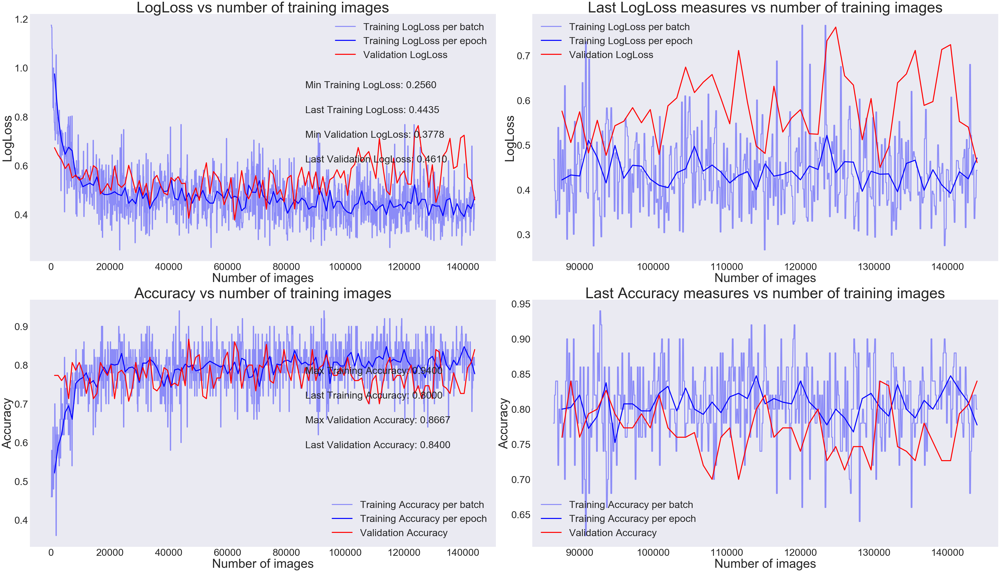

In [639]:
#Plot the loss curves for training and validation
plot_metrics(history, last_perc = 0.4)
plt.tight_layout()

We can see that the model is heavily overfitting up to around 400 batches and then quickly improves.

We can visualize kernels for the first convolution layer as well as it's output to see how our model "sees" the numbers.

In [487]:
def plot_layer(x, n_row, n_col , use_grid=False, start_cell=0):
    for j in range(min(len(x),n_row*n_col)):
        if (not use_grid):
            plt.subplot(n_row, n_col, start_cell+j+1)
        else:
            plt.subplot2grid((n_row, n_col), ((start_cell + j) // n_col - 1, (start_cell + j) % n_row), colspan=8) 
        plt.imshow(x[j], cmap=plt.get_cmap('gray'))
        plt.axis('off')
    #plt.tight_layout()
    return plt

In [488]:
#np.moveaxis(K.get_session().run(model.layers[1].kernel),2,0)

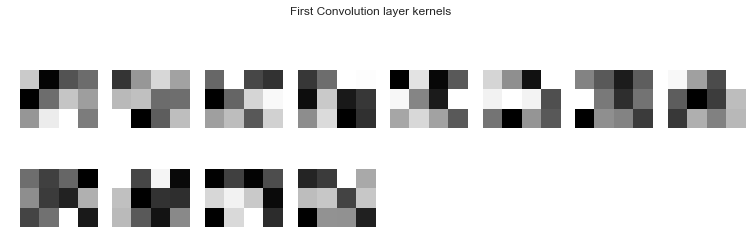

In [640]:
plt.figure(figsize=(13,7))
kernels = np.moveaxis(np.moveaxis(K.get_session().run(model.layers[1].kernel),2,0),2,1)
plot_layer(kernels,4,8)
plt.suptitle('First Convolution layer kernels')
plt.show()

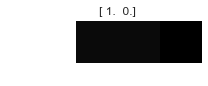

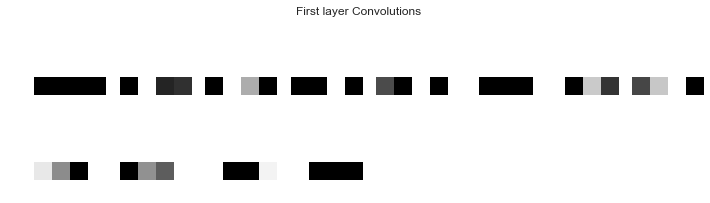

In [641]:
#get random training image
img_id = np.random.randint(len(X_train))
img = X_train[img_id]
#plt.subplots(5,8,figsize=(12,6))
#ax1 = plt.subplot2grid((5, 8), (0, 0), colspan=8)
plt.figure(figsize=(3,3))
plt.imshow(img.reshape(1,4), cmap=plt.get_cmap('gray'))
plt.axis('off')
plt.title(Y_train_cat[img_id])
plt.show()

output0 = model.layers[0].output
input0 = model.layers[0].input
output1 = model.layers[1].output
input1 = model.layers[1].input

activations0 = K.get_session().run(output0, feed_dict={input0:img.astype(np.float32).reshape(1,4,1)})
activations1 = K.get_session().run(output1, feed_dict={input1:activations0})
activations0 = np.moveaxis(activations0,2,0)
activations1 = np.moveaxis(activations1,2,0)
plt.figure(figsize=(12,6))
plot_layer(activations1,4,8)
plt.suptitle('First layer Convolutions')
plt.show()

Continue learning

In [491]:
activations1.shape

(24, 1, 4)

### <a name="ensembling"></a>4.3 Ensembling

In [492]:
def fit_model_and_save(model,ver=1,num=1,history=[],epochs_per_each_step=2, epochs_last_step=3,
                       steps=2,
                       start_lr=None, lr_decrease_after_steps=1):
    print("Training model: " + str(num))
    temp_history = History()
    model_save_callback.Reset()
    model = fit_model(model, 
                      epochs_per_each_step=epochs_per_each_step,
                      epochs_last_step=epochs_last_step,
                      steps=steps,
                      use_train_batches = train_batches,
                      history_callback = history_callback,
                      model_save_callback=model_save_callback,
                      history=temp_history,
                      start_lr=start_lr,
                      lr_decrease_after_steps=lr_decrease_after_steps
                     )
    #load best model weights
    if (model_save_callback.best_model_weights != None):
        print("\nRetrieving best model weights with validation accuracy: " + str(model_save_callback.max_val_accuracy))
        model.set_weights(model_save_callback.best_model_weights)
    history.append(temp_history) #append metrics for each model to the list
    plot_metrics(temp_history, last_perc=0.4) #plot loss and accuracy curves for a finished model
    plt.show()
    print("Saving weights for model: " + str(num))
    model.save_weights(model_path + 'cnn-mnist-'+str(num)+'-v-' + ver+'.pkl')
    return model

We define a function load_model to be able to load previously trained weights and continue from that point.

In [493]:
def load_model(model,ver="2",num=1):
    model.load_weights(model_path + 'cnn-mnist-'+str(num)+'-v-' + ver+'.pkl')
    return model

In [642]:
num_models = 6
dropouts = [[0,    0.1,  0.1,  0.25, 0.25],
            [0.1,  0.1,  0.1,  0.25, 0.5 ],
            [0.1,  0.25, 0.1,  0.25, 0.5 ],
            [0.1,  0.25, 0.15, 0.5,  0.5 ],
            [0.1,  0.25, 0.15, 0.5,  0.5 ],
            [0.15, 0.25, 0.25, 0.5,  0.75 ]
           ]
models = [cnn_model(x) for x in dropouts]

In [643]:
pickle_dump(dropouts,'cnn-dropouts-dump')

In [644]:
#models = [load_model(m,ver=1,num=i) for i,m in enumerate(models)]

In [645]:
histories = History()

In [646]:
start_time = time.time()

Training model: 0
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 9s - loss: 0.9523 - acc: 0.5650 - val_loss: 0.6688 - val_acc: 0.7867
Epoch 2/8
8/8 [==============================] - 1s - loss: 0.8744 - acc: 0.5850 - val_loss: 0.6252 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.7024 - acc: 0.6775 - val_loss: 0.5972 - val_acc: 0.7867
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.7215 - acc: 0.7000 - val_loss: 0.5840 - val_acc: 0.7933
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.6890 - acc: 0.6800 - val_loss: 0.5894 - val_acc: 0.7667
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7011 - acc: 0.6725 - val_loss: 0.5826 - val_acc: 0.7600
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.6156 - acc: 0.7325 - val_loss: 0.6142 - val_acc: 0.7000
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5647 - acc: 0.7625 

8/8 [==============================] - 0s - loss: 0.4511 - acc: 0.8100 - val_loss: 0.6154 - val_acc: 0.6933
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.5039 - acc: 0.7725 - val_loss: 0.5244 - val_acc: 0.7933
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.4657 - acc: 0.8025 - val_loss: 0.4789 - val_acc: 0.8000
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.4637 - acc: 0.7975 - val_loss: 0.5277 - val_acc: 0.7800
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.4405 - acc: 0.8100 - val_loss: 0.6370 - val_acc: 0.7000
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.4541 - acc: 0.8075 - val_loss: 0.6928 - val_acc: 0.6933
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.4883 - acc: 0.7775 - val_loss: 0.4941 - val_acc: 0.7867
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.4567 - acc: 0.8025 - val_loss: 0.5055 - val_acc: 0.7800
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


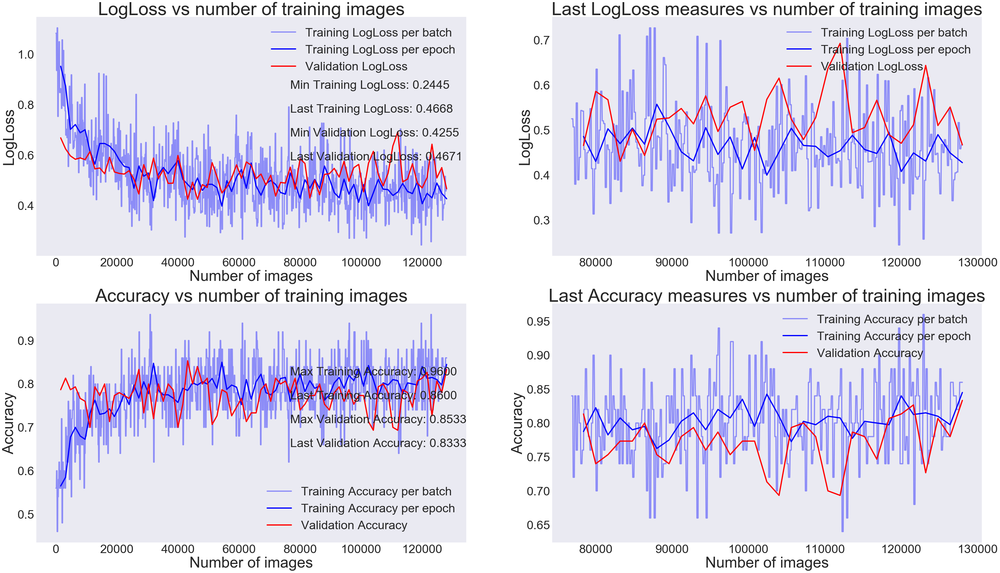

Saving weights for model: 0
Training model: 1
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.0705 - acc: 0.5025 - val_loss: 0.6678 - val_acc: 0.7000
Epoch 2/8
8/8 [==============================] - 0s - loss: 1.0006 - acc: 0.5500 - val_loss: 0.6341 - val_acc: 0.7400
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.9011 - acc: 0.6175 - val_loss: 0.6054 - val_acc: 0.7600
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.9025 - acc: 0.6075 - val_loss: 0.5953 - val_acc: 0.7600
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8443 - acc: 0.5825 - val_loss: 0.6085 - val_acc: 0.7267
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7786 - acc: 0.6400 - val_loss: 0.5732 - val_acc: 0.7800
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7232 - acc: 0.6475 - val_loss: 0.5820 - val_acc: 0.7533
Epoch 8/8
8/8 [==============================] - 0s -

8/8 [==============================] - 0s - loss: 0.4569 - acc: 0.7725 - val_loss: 0.4793 - val_acc: 0.8133
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.4617 - acc: 0.8050 - val_loss: 0.4451 - val_acc: 0.8267
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.4304 - acc: 0.8325 - val_loss: 0.5576 - val_acc: 0.7733
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.4711 - acc: 0.7925 - val_loss: 0.5350 - val_acc: 0.7733
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.4766 - acc: 0.7925 - val_loss: 0.5577 - val_acc: 0.7600
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.4892 - acc: 0.7875 - val_loss: 0.5328 - val_acc: 0.7800
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.4773 - acc: 0.8050 - val_loss: 0.4282 - val_acc: 0.8067
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5237 - acc: 0.7675 - val_loss: 0.4720 - val_acc: 0.8333
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


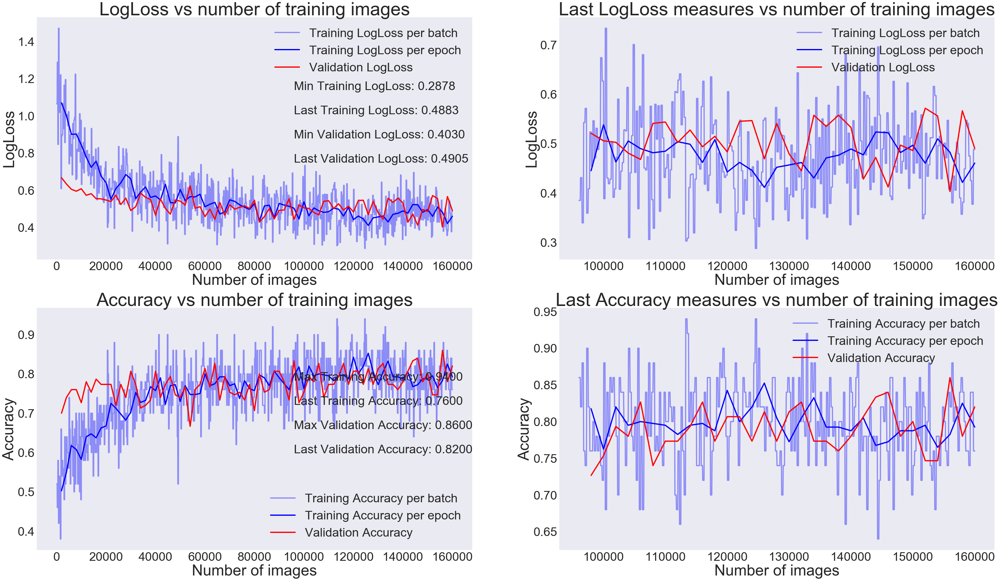

Saving weights for model: 1
Training model: 2
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 6s - loss: 1.2441 - acc: 0.4925 - val_loss: 0.6701 - val_acc: 0.7600
Epoch 2/8
8/8 [==============================] - 1s - loss: 1.0577 - acc: 0.5625 - val_loss: 0.6411 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.0124 - acc: 0.5675 - val_loss: 0.6151 - val_acc: 0.8133
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.8657 - acc: 0.6475 - val_loss: 0.6143 - val_acc: 0.7467
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8535 - acc: 0.5925 - val_loss: 0.6240 - val_acc: 0.7067
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.8459 - acc: 0.6175 - val_loss: 0.6057 - val_acc: 0.7333
Epoch 7/8
8/8 [==============================] - 1s - loss: 0.7724 - acc: 0.6200 - val_loss: 0.5809 - val_acc: 0.7733
Epoch 8/8
8/8 [==============================] - 0s -

8/8 [==============================] - 0s - loss: 0.4518 - acc: 0.8200 - val_loss: 0.3990 - val_acc: 0.8600
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.4907 - acc: 0.7825 - val_loss: 0.5001 - val_acc: 0.7800
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.4555 - acc: 0.8375 - val_loss: 0.5216 - val_acc: 0.7867
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.4710 - acc: 0.7950 - val_loss: 0.4888 - val_acc: 0.7800
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.4869 - acc: 0.7900 - val_loss: 0.4722 - val_acc: 0.7933
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.4795 - acc: 0.7825 - val_loss: 0.5335 - val_acc: 0.7867
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.4874 - acc: 0.8000 - val_loss: 0.4815 - val_acc: 0.7800
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5293 - acc: 0.7950 - val_loss: 0.5762 - val_acc: 0.7267
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


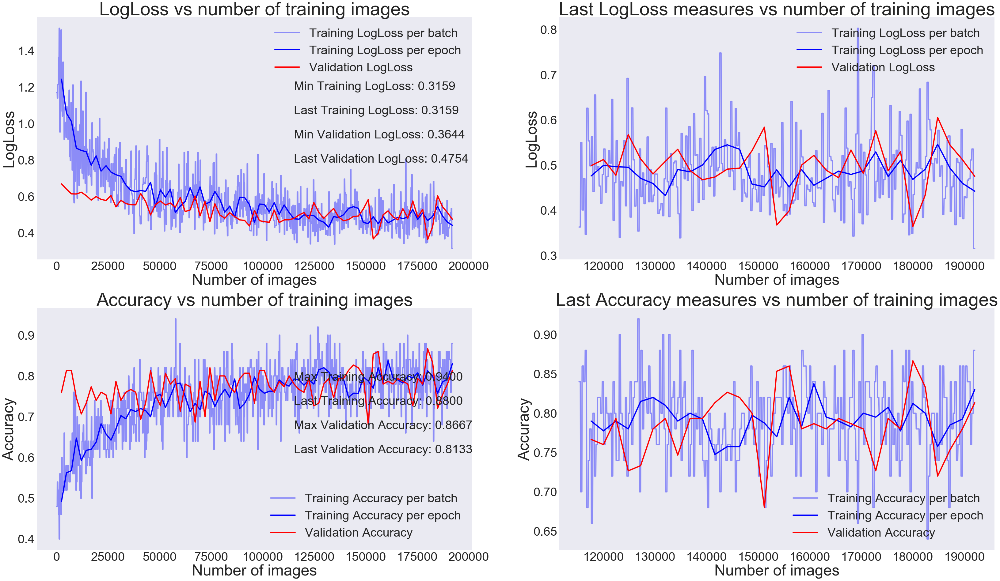

Saving weights for model: 2
Training model: 3
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.1755 - acc: 0.5375 - val_loss: 0.6739 - val_acc: 0.7533
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.9521 - acc: 0.5575 - val_loss: 0.6470 - val_acc: 0.7467
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.0774 - acc: 0.5725 - val_loss: 0.6259 - val_acc: 0.7533
Epoch 4/8
8/8 [==============================] - 0s - loss: 1.0177 - acc: 0.5400 - val_loss: 0.6019 - val_acc: 0.7667
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.9200 - acc: 0.6150 - val_loss: 0.5853 - val_acc: 0.7667
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7923 - acc: 0.6150 - val_loss: 0.5768 - val_acc: 0.7600
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7587 - acc: 0.6650 - val_loss: 0.5380 - val_acc: 0.7933
Epoch 8/8
8/8 [==============================] - 1s -

8/8 [==============================] - 0s - loss: 0.4929 - acc: 0.7825 - val_loss: 0.3956 - val_acc: 0.8200
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.4884 - acc: 0.7950 - val_loss: 0.4385 - val_acc: 0.8200
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.4738 - acc: 0.7850 - val_loss: 0.4698 - val_acc: 0.7933
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.4805 - acc: 0.7800 - val_loss: 0.3668 - val_acc: 0.8467
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.5106 - acc: 0.7550 - val_loss: 0.4960 - val_acc: 0.7200
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.4637 - acc: 0.8025 - val_loss: 0.5373 - val_acc: 0.7600
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.5041 - acc: 0.7750 - val_loss: 0.5703 - val_acc: 0.7267
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5401 - acc: 0.7650 - val_loss: 0.4787 - val_acc: 0.7733
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


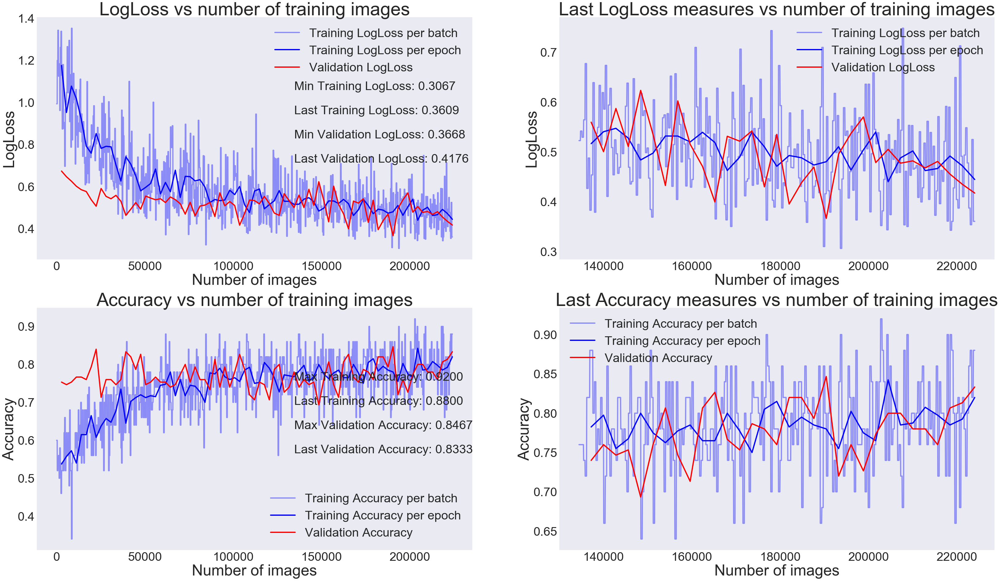

Saving weights for model: 3
Training model: 4
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 6s - loss: 1.1680 - acc: 0.5250 - val_loss: 0.6606 - val_acc: 0.7733
Epoch 2/8
8/8 [==============================] - 0s - loss: 1.0113 - acc: 0.6175 - val_loss: 0.6432 - val_acc: 0.7267
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.9505 - acc: 0.6075 - val_loss: 0.6125 - val_acc: 0.7600
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.8528 - acc: 0.6150 - val_loss: 0.6025 - val_acc: 0.7467
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.8762 - acc: 0.6075 - val_loss: 0.5955 - val_acc: 0.7467
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.7999 - acc: 0.6300 - val_loss: 0.5907 - val_acc: 0.7467
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.7629 - acc: 0.6450 - val_loss: 0.5853 - val_acc: 0.7600
Epoch 8/8
8/8 [==============================] - 0s -

8/8 [==============================] - 0s - loss: 0.4480 - acc: 0.8050 - val_loss: 0.4757 - val_acc: 0.7533
Epoch 2/8
8/8 [==============================] - 0s - loss: 0.4820 - acc: 0.8025 - val_loss: 0.5847 - val_acc: 0.6933
Epoch 3/8
8/8 [==============================] - 0s - loss: 0.5174 - acc: 0.7700 - val_loss: 0.4341 - val_acc: 0.8400
Epoch 4/8
8/8 [==============================] - 0s - loss: 0.5110 - acc: 0.7650 - val_loss: 0.4842 - val_acc: 0.7600
Epoch 5/8
8/8 [==============================] - 0s - loss: 0.5336 - acc: 0.7500 - val_loss: 0.4680 - val_acc: 0.8200
Epoch 6/8
8/8 [==============================] - 0s - loss: 0.5173 - acc: 0.7575 - val_loss: 0.5002 - val_acc: 0.8133
Epoch 7/8
8/8 [==============================] - 0s - loss: 0.4948 - acc: 0.8025 - val_loss: 0.4981 - val_acc: 0.7733
Epoch 8/8
8/8 [==============================] - 0s - loss: 0.5312 - acc: 0.7650 - val_loss: 0.4410 - val_acc: 0.8333
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


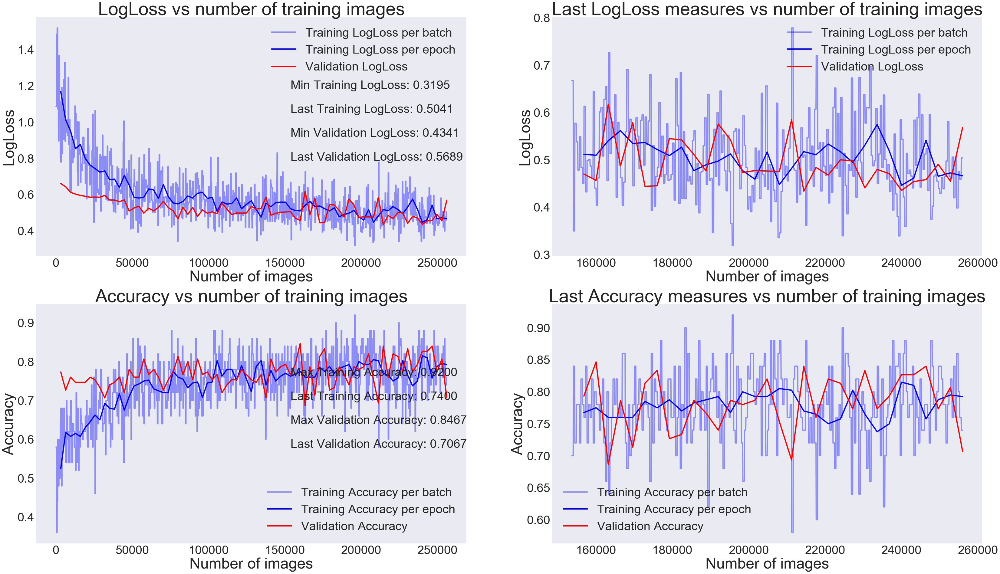

Saving weights for model: 4
Training model: 5
Starting with default learning rate.
Fitting step: 1
Add data augmentation
Epoch 1/8
8/8 [==============================] - 7s - loss: 1.4283 - acc: 0.5400 - val_loss: 0.6572 - val_acc: 0.8000
Epoch 2/8
8/8 [==============================] - 1s - loss: 1.5961 - acc: 0.5350 - val_loss: 0.6217 - val_acc: 0.8133
Epoch 3/8
8/8 [==============================] - 0s - loss: 1.4249 - acc: 0.5650 - val_loss: 0.6145 - val_acc: 0.7733
Epoch 4/8
8/8 [==============================] - 0s - loss: 1.6327 - acc: 0.5175 - val_loss: 0.5742 - val_acc: 0.8400
Epoch 5/8
8/8 [==============================] - 0s - loss: 1.3276 - acc: 0.5500 - val_loss: 0.6065 - val_acc: 0.7467
Epoch 6/8
8/8 [==============================] - 0s - loss: 1.0893 - acc: 0.5900 - val_loss: 0.5789 - val_acc: 0.7733
Epoch 7/8
8/8 [==============================] - 0s - loss: 1.2337 - acc: 0.5625 - val_loss: 0.5621 - val_acc: 0.7933
Epoch 8/8
8/8 [==============================] - 0s -

8/8 [==============================] - 1s - loss: 0.5424 - acc: 0.7550 - val_loss: 0.4559 - val_acc: 0.8000
Epoch 2/8
8/8 [==============================] - 1s - loss: 0.5453 - acc: 0.7650 - val_loss: 0.5252 - val_acc: 0.7533
Epoch 3/8
8/8 [==============================] - 1s - loss: 0.5408 - acc: 0.7725 - val_loss: 0.4683 - val_acc: 0.8133
Epoch 4/8
8/8 [==============================] - 1s - loss: 0.5080 - acc: 0.7575 - val_loss: 0.4593 - val_acc: 0.7667
Epoch 5/8
8/8 [==============================] - 1s - loss: 0.5244 - acc: 0.7650 - val_loss: 0.4653 - val_acc: 0.7800
Epoch 6/8
8/8 [==============================] - 1s - loss: 0.5589 - acc: 0.7450 - val_loss: 0.4650 - val_acc: 0.8067
Epoch 7/8
8/8 [==============================] - 1s - loss: 0.5395 - acc: 0.7425 - val_loss: 0.4403 - val_acc: 0.7800
Epoch 8/8
8/8 [==============================] - 1s - loss: 0.5498 - acc: 0.7275 - val_loss: 0.5707 - val_acc: 0.6733
Fitting step: 10
Setting learning rate to: 1.0000000000000002e-06


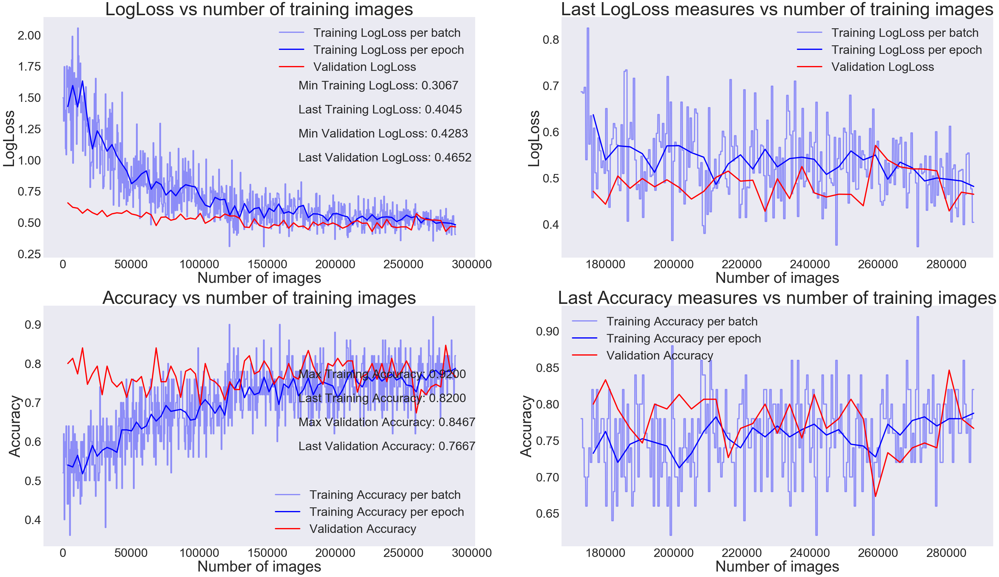

Saving weights for model: 5


In [647]:
models = [fit_model_and_save(m,ver=version,num=i,history=histories,
                             epochs_per_each_step=8,
                             epochs_last_step=0,
                             steps=[0,10],
                             lr_decrease_after_steps=2
                            ) for i,m in enumerate(models)]

In [648]:
elapsed_time = time.time() - start_time
print("Elapsed model ensemble training time: " + str(elapsed_time//60) + " minutes " + str(elapsed_time % 60) + " seconds")

Elapsed model ensemble training time: 10.0 minutes 11.934837579727173 seconds


In [649]:
pickle_dump(histories,'cnn-ensemble-train-histories-dump')

We can add our single trained model to the ensemble.

In [650]:
models_all = models.copy()
models_all.append(model)

In [651]:
models_all

In [652]:
evals = np.array([m.evaluate(X_val.reshape(-1,X_val.shape[1],1), Y_val_cat, batch_size=batch_size) for m in models_all])

173/173 [==============================] - 0s     


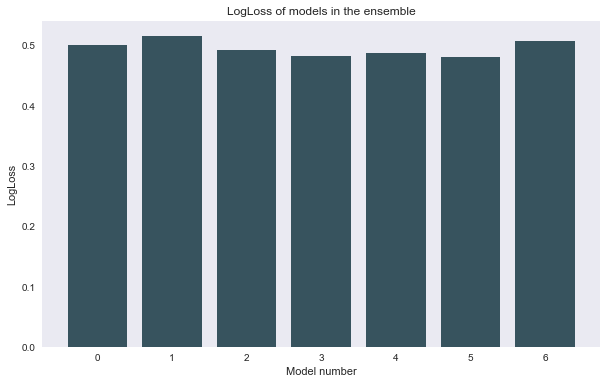

In [698]:
plt.bar(range(len(evals)),evals[:,0])
plt.xlabel('Model number')
plt.ylabel('LogLoss')
plt.title('LogLoss of models in the ensemble')

In [665]:
print("Mean log loss of the ensembled models: " + str(evals.mean(axis=0)[0]))
print("Mean prediction accuracy of the ensembled models: " + str(evals.mean(axis=0)[1]))

Mean log loss of the ensembled models: 0.494844484733
Mean prediction accuracy of the ensembled models: 0.786127143414


In [669]:
print("Min log loss of the ensembled models: " + str(evals.min(axis=0)[0]))
print("Max prediction accuracy of the ensembled models: " + str(evals.max(axis=0)[1]))

Min log loss of the ensembled models: 0.480518088175
Max prediction accuracy of the ensembled models: 0.791907491712


In [695]:
all_preds = np.stack([m.predict(X_val.reshape(-1,X_val.shape[1],1), batch_size=batch_size,verbose=1) for m in models_all])

avg_preds = all_preds.mean(axis=0)
loss = categorical_crossentropy(tf.convert_to_tensor(Y_val_cat), tf.convert_to_tensor(avg_preds.astype(np.float64))).eval(session=K.get_session())
acc = categorical_accuracy(tf.convert_to_tensor(Y_val_cat), tf.convert_to_tensor(avg_preds)).eval(session=K.get_session())
print("\nLog loss of the ensemble of models: " + str(loss.sum()/Y_val_cat.shape[0]))
print("Accuracy of the ensemble of models: " + str(acc.sum()/Y_val_cat.shape[0]))

 50/173 [=======>......................] - ETA: 0sLog loss of the ensemble of models: 0.484342948029
Accuracy of the ensemble of models: 0.78612716763


### Simple NN for the ensemble

In [740]:
def nn_ensemble(dropouts = [0.1,0.1,0.1]):
    model = Sequential([
        Dense(28, activation = 'relu', input_shape=(7,)),
        BatchNormalization(),
        Dropout(dropouts[0]),
        Dense(56, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(56, activation = 'relu'),
        BatchNormalization(),
        Dropout(dropouts[1]),
        Dense(2, activation = 'softmax')
    ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_ensemble = nn_ensemble()

In [741]:
x_preds = np.moveaxis(all_preds,1,0)[:,:,1]
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
              patience=5, min_lr=0.00000000001)
model_ensemble.fit(x_preds,Y_val_cat, epochs=125, 
                    validation_split=0.3,
                    verbose=1,
                    callbacks=[reduce_lr]
                   )

Train on 121 samples, validate on 52 samples
Epoch 1/125
121/121 [==============================] - 5s - loss: 0.8336 - acc: 0.5289 - val_loss: 0.6655 - val_acc: 0.7885
Epoch 2/125
121/121 [==============================] - 0s - loss: 0.7919 - acc: 0.5950 - val_loss: 0.6524 - val_acc: 0.7885
Epoch 3/125
121/121 [==============================] - 0s - loss: 0.7765 - acc: 0.5950 - val_loss: 0.6369 - val_acc: 0.7885
Epoch 4/125
121/121 [==============================] - 0s - loss: 0.7444 - acc: 0.6033 - val_loss: 0.6201 - val_acc: 0.7885
Epoch 5/125
121/121 [==============================] - 0s - loss: 0.6310 - acc: 0.6694 - val_loss: 0.6039 - val_acc: 0.7885
Epoch 6/125
121/121 [==============================] - 0s - loss: 0.6634 - acc: 0.7025 - val_loss: 0.5911 - val_acc: 0.7885
Epoch 7/125
121/121 [==============================] - ETA: 0s - loss: 0.6627 - acc: 0.750 - 0s - loss: 0.6106 - acc: 0.7603 - val_loss: 0.5811 - val_acc: 0.7885
Epoch 8/125
121/121 [============================

121/121 [==============================] - 0s - loss: 0.4013 - acc: 0.8512 - val_loss: 0.4714 - val_acc: 0.7885
Epoch 66/125
121/121 [==============================] - 0s - loss: 0.4295 - acc: 0.8264 - val_loss: 0.4697 - val_acc: 0.7885
Epoch 67/125
121/121 [==============================] - 0s - loss: 0.4705 - acc: 0.8017 - val_loss: 0.4682 - val_acc: 0.7885
Epoch 68/125
121/121 [==============================] - 0s - loss: 0.4047 - acc: 0.8017 - val_loss: 0.4672 - val_acc: 0.7885
Epoch 69/125
121/121 [==============================] - 0s - loss: 0.3881 - acc: 0.8512 - val_loss: 0.4663 - val_acc: 0.7885
Epoch 70/125
121/121 [==============================] - 0s - loss: 0.4155 - acc: 0.8264 - val_loss: 0.4655 - val_acc: 0.7885
Epoch 71/125
121/121 [==============================] - 0s - loss: 0.4070 - acc: 0.8430 - val_loss: 0.4642 - val_acc: 0.7885
Epoch 72/125
121/121 [==============================] - 0s - loss: 0.4743 - acc: 0.7769 - val_loss: 0.4632 - val_acc: 0.7885
Epoch 73/125


In [706]:
x_preds = np.moveaxis(all_preds,1,0)[:,:,1]
x_preds.shape

(173, 7)

In [670]:
print(all_preds.shape)
np.clip(np.array([np.sum(all_preds[:,x,1] > 0.5)/all_preds.shape[0] for x in range(all_preds.shape[1])]),0.15,0.85)[:5]

(7, 173, 2)


array([ 0.85      ,  0.15      ,  0.71428571,  0.85      ,  0.15      ])

### <a name="confusion-matrix"></a>4.4 Confusion matrix and classification report

In [658]:
#val_preds = model.predict(X_val, batch_size=100,verbose=1)
#use prediction from ensembling
val_preds = avg_preds

Let's first define a function that will plot our confusion matrix.

In [659]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    (This function is copied from the scikit docs.)
    """
    plt.figure()
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[121  11]
 [ 26  15]]


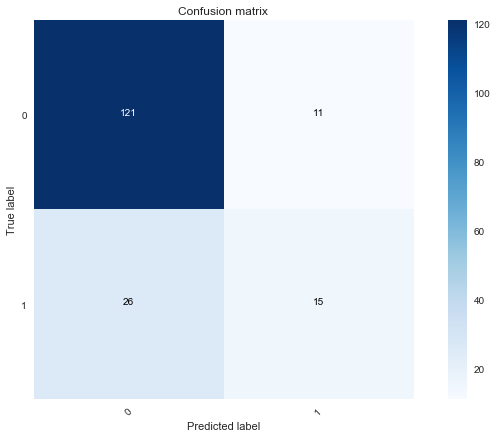

In [660]:
conf_matrix = confusion_matrix(np.argmax(Y_val_cat,axis=1),np.argmax(val_preds,axis=1))
plot_confusion_matrix(conf_matrix, classes=range(2))

Now let's look at f1-score precision and recall to see how our model is performing on each digit.

In [661]:
print(classification_report(np.argmax(Y_val_cat,axis=1),np.argmax(val_preds,axis=1)))

             precision    recall  f1-score   support

          0       0.82      0.92      0.87       132
          1       0.58      0.37      0.45        41

avg / total       0.76      0.79      0.77       173



In [662]:
test.head()

,Months since Last Donation,Number of Donations,Total Volume Donated (c.c.),Months since First Donation
659,2,12,3000,52
276,21,7,1750,38
263,4,1,250,4
303,11,11,2750,38
83,4,12,3000,34


In [680]:
test_preds = np.stack([m.predict(test_n.reshape(-1,test_n.shape[1],1), batch_size=batch_size,verbose=1) for m in models_all])
avg_test_preds = test_preds.mean(axis=0)

maj_vote_preds = np.clip(np.array([
    np.sum(test_preds[:,x,1] > 0.5)/test_preds.shape[0] for x in range(test_preds.shape[1])
]),0.15,0.85)

submission1 = pd.DataFrame({'ImageId':test.index,'Made Donation in March 2007':avg_test_preds[:,1]})
submission = pd.DataFrame({'ImageId':test.index,'Made Donation in March 2007':maj_vote_preds})
submission1.set_index('ImageId',inplace=True)
submission1.index.name = None
submission.set_index('ImageId',inplace=True)
submission.index.name = None
submission.to_csv('submission-s-maj' + version + '.csv')
submission1.to_csv('submission-s-mean' + version + '.csv')
submission.head()

 50/200 [======>.......................] - ETA: 0s

,Made Donation in March 2007
659,0.571429
276,0.150000
263,0.150000
303,0.150000
83,0.850000


In [664]:
submission1.head()

,ImageId,Made Donation in March 2007
0,659,0.549165
1,276,0.165493
2,263,0.193681
3,303,0.184440
4,83,0.641658


In [ ]:
avg_test_preds.shape